# Ice Algae timing : impact of limitation threshold

Diagnostics of light and N limitation timing

## Setup

In [1]:
import xarray as xr
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.dates as mdate
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
from matplotlib.lines import Line2D
from matplotlib.ticker import LogLocator
import matplotlib.patches as mpatches

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import palettable.cmocean.sequential as cmOcSeq
import palettable.cmocean.diverging as cmOcDiv
import seaborn as sns

from datetime import datetime, timedelta

from glob import glob 

import utilsRegions as urgn
import utilsGen as utl
import mapPlots as mplt
import diagnostics as dgnst
import utlshistograms as uhist

%load_ext autoreload
%autoreload 2

In [ ]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster(dashboard_address=':8181',n_workers=16, threads_per_worker=1)
client = Client(cluster)

http://127.0.0.1:8181/status

In [28]:
cluster.close()
client.close()

### Load data

In [3]:
scenarios = ['historical-DFS-G510.00','RCP85-G510.14-G515.00-01']
titleClim = {'historical-DFS-G510.00': '1981-2000', 'RCP85-G510.14-G515.00-01': '2066-2085 (RCP 8.5)' }
timeperiod = {'historical-DFS-G510.00': slice('1981','2000'), 'RCP85-G510.14-G515.00-01': slice('2066','2085') }
hist,rcp85 = scenarios

dadic={}
# datadir = '/net/venus/kenes/user/jlanger/'
datadir = '/tsanta/ahaddon/data/'
utl.loadNAAmesh(dadic)

In [4]:
for scn in scenarios: 
    dadic[scn+'biolog'] = xr.open_mfdataset(datadir+scn+'/NAA_1d_*_biolog.nc', combine='by_coords', parallel=True,chunks={'time_counter':365,'x':200,'y':200})
    dadic[scn+'diad'] = xr.open_mfdataset(datadir+scn+'/NAA_730h_*_diad_T.nc', combine='by_coords', parallel=True)

In [5]:
clim30y={hist:'1980-2009', rcp85:'2056-2085'}

## Climatologies

In [5]:
clim={}
for scn in scenarios:
    print('\n'+scn)
    clim[scn+'ileadfra2'] = utl.climatology(dadic, scn, 'biolog', 'ileadfra2', group='day', gca=False, fillna=0.,timeperiod=timeperiod[scn]).where(dadic['landMask']) 
    # clim[scn+'iicethic'] = utl.climatology(dadic, scn, 'biolog', 'iicethicgca', group='day', gca=True, fillna=0.).where(dadic['landMask']) 
    # clim[scn+'isnowthi'] = utl.climatology(dadic, scn, 'biolog', 'isnowthigca', group='day', gca=True, fillna=0.).where(dadic['landMask']) 
    clim[scn+'icedia'] = utl.climatology(dadic, scn, 'biolog', 'icediagca', group='day', gca=True, unitName='mmol C m$^{-2}$', fillna=0.,timeperiod=timeperiod[scn]).where(dadic['landMask'])   
    clim[scn+'fstric'] = utl.climatology(dadic, scn, 'biolog', 'fstricgca', group='day', gca=True, fillna=0.,timeperiod=timeperiod[scn]).where(dadic['landMask']) 
    clim[scn+'iceno3'] = utl.climatology(dadic, scn, 'biolog', 'iceno3gca', group='day', gca=True, fillna=0.,timeperiod=timeperiod[scn]).where(dadic['landMask']) 
    clim[scn+'icenh4'] = utl.climatology(dadic, scn, 'diad', 'icenh4', group='time_counter.month', convFac=0.03 , fillna=0.,timeperiod=timeperiod[scn]).where(dadic['landMask'])  #convert to mmol m^-2
    clim[scn+'icenh4']= utl.resampleClimDaily(clim[scn+'icenh4']).where(dadic['landMask']) 


historical-DFS-G510.00
ileadfra2 icediagca fstricgca iceno3gca icenh4 
RCP85-G510.14-G515.00-01
ileadfra2 icediagca fstricgca iceno3gca icenh4 

#### Save

In [15]:
varsave = ['ileadfra2','icedia','fstric','iceno3','icenh4','icedia']#,'iicethic','isnowthi']
for scn in scenarios:
    for var in varsave:
        clim[scn+var].to_netcdf(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/{var}_20yclim{titleClim[scn][:9]}_1d.nc')

## Diagnostics

from model output directly

### single year check

In [ ]:
scn=scenarios[1]

# xi,yi =[limpar.max(dim=['time_counter']).argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi =[doyNlim.argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi=259, 119 ##CAA nemesis
# xi,yi=379, 2 ## low lat N snd spike
# xi,yi= 150,150 # beafirt low
# xi,yi=158, 92 ## amundsen gulf 2nd N max
xi,yi=310, 100 ## baffin 2nd N

# xi,yi =[clim[scn+'icedia'].sel(dayofyear=slice(250,365)).max(dim=['dayofyear']).argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]

# xi,yi = [doySIbu.where(doySIbu>50).argmin(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
xi,yi=412, 194 # greenland crazy ice
# xi,yi=128, 110 ## near amdmusen
xi,yi=180,345 #siberia
print(xi,yi)


pc,nc,ic='tab:orange','tab:blue','r'
fig,ax=plt.subplots(1,2,figsize=(16,5))
days=range(1,366)
    
ax[0].plot(days,limpar.isel(x=xi,y=yi),'.',c=pc,ms=2)
smLpar = limpar.isel(x=xi,y=yi).rolling(time_counter=5,min_periods=1,center=True).mean()
ax[0].plot(days,smLpar,c=pc,label='PAR lim')
dlimP = doyPARlim.isel(x=xi,y=yi)
ax[0].plot([dlimP,dlimP],[0,0.5],'--',c=pc)
# dlimP = dgnst.doyPARlim(clim[scn+'limpar'].isel(x=xi,y=yi),0.5)
# ax[0].plot([dlimP,dlimP],[0,0.5],'--',c=pc)

ax[0].plot(days,limN.isel(x=xi,y=yi),'.',c=nc,ms=0.5)
smLn = limN.isel(x=xi,y=yi).rolling(time_counter=5,min_periods=1,center=True).mean()
ax[0].plot(days,smLn,c=nc,label='N lim')
dlimN = doyNlim.isel(x=xi,y=yi)
ax[0].plot([dlimN,dlimN],[0,0.5],'--',c=nc)
# dlimN2= dgnst.doyNlim(clim[scn+'limN'].isel(x=xi,y=yi),0.5)
# ax[0].plot([dlimN2,dlimN2],[0,0.5],'--',c=nc)

sicy=sic.sel(time_counter=year)
ax[0].plot(days,sicy.isel(x=xi,y=yi),'.',c=ic,ms=2)
smSic = sicy.isel(x=xi,y=yi).rolling(time_counter=5,min_periods=1,center=True).mean()
ax[0].plot(days,smSic,c=ic,label='SI conc')
dlimSIb = doySIbu.isel(x=xi,y=yi)
# dlimSIb = dgnst.doySIbreak(clim[scn+'ileadfra2'].isel(x=xi,y=yi),0.5)
ax[0].plot([dlimSIb,dlimSIb],[0,0.5],'--',c=ic)

ax[0].legend(loc='center right')
ax[0].plot([1,365],[0.5,0.5],'k')

dlim = doySwitch.isel(x=xi,y=yi)
# ax[0].plot([dlim,dlim],[0,limpar.isel(x=xi,y=yi).sel(time_counter=limpar.time_counter.dt.dayofyear.isin([dlim]))[0]],'k--')
ax[0].plot([dlim,dlim],[0,limswitch.isel(x=xi,y=yi)],'k--')

least_lim = leastlim.isel(x=xi,y=yi)
ax[0].plot([1,365],[least_lim]*2,'-.')


# dSIfu = dgnst.doySIfreezeUp(clim[scn+'ileadfra2'].isel(x=xi,y=yi),0.5)
# print(dSIfu)
# ax[0].plot([dSIfu,dSIfu],[0,0.5],'-.',c=ic)


IA=ia.isel(x=xi,y=yi)
ax[1].plot(days,IA,'g',label='IA')
# ax[1].plot([0,365],[IA.mean()]*2,'g--',label='mean')
# ax[1].plot([60,180],[IA.sel(dayofyear=slice(60,180)).mean()]*2,'g-.',label='mean MAMJ')
# ax[1].plot([0,365],[IA.std()]*2,'g:',label='std')
ax[1].legend()
    
iamax=IA.max()
ax[1].plot([dlimP,dlimP],[0,iamax],'--',c=pc)
ax[1].plot([dlimN,dlimN],[0,iamax],'--',c=nc)
ax[1].plot([dlim,dlim],[0,iamax],'k--')
ax[1].plot([dlimSIb,dlimSIb],[0,iamax],'--',c=ic)
# ax[1].plot([dSIfu,dSIfu],[0,iamax],'-.',c=ic)

fig,ax = mplt.initmaps()
ax.plot(dadic['mesh'].nav_lon.isel(x=xi,y=yi), dadic['mesh'].nav_lat.isel(x=xi,y=yi), 'o', ms=5,
        transform=ccrs.PlateCarree())


In [ ]:
plt.pcolormesh(doySIbu)
plt.colorbar()
plt.figure()
sic_onday = sic.isel(time_counter=doySIbu.fillna(1).astype(int)+5)
plt.pcolormesh(sic_onday.where((sic_onday>0)&(doySIbu>0)), vmin=0.4,vmax=0.6)
# plt.axis([390,415,185,210])
plt.colorbar()

In [ ]:
plt.pcolormesh(doyNlim)
plt.colorbar()
plt.figure()
limN_onday = limN.isel(time_counter=doyNlim.fillna(1).astype(int)+5)
plt.pcolormesh(limN_onday.where(limN_onday>=0), vmin=0.4,vmax=0.6)
# plt.axis([390,415,185,210])
plt.colorbar()

### Compute and save

#### Growth limitations 

In [ ]:
for scn in scenarios:
    print(scn)
    dly=dadic[scn+'biolog'].sel(time_counter=timeperiod[scn]).where(dadic['mesh'].nav_lat>60).chunk({'x':100,'y':100})

    # par_insitu = xr.where(dly.ileadfra2>0, dly.fstricgca/dly.ileadfra2, np.nan)
    # limpar = dgnst.limPAR(par_insitu)
    # limpar.name ='limpar'
    # limpar.to_netcdf(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/limpar_{titleClim[scn][:9]}_1d.nc')

    nh4_m = dadic[scn+'diad'].icenh4.sel(time_counter=timeperiod[scn]).where(dadic['mesh'].nav_lat>60).chunk({'x':100,'y':100})
    # # interp on the entire 30 years will output a single chunk, cause lot of data loaded in ram
    # # group by year to do 1 year at a time and end up with 1 chunk/year
    nh4_dly= nh4_m.groupby('time_counter.year').map(lambda dn : dn.interp(
                    time_counter=dly.iceno3gca.time_counter.sel(time_counter=str(dn.time_counter.dt.year.values[0])), kwargs={"fill_value": "extrapolate"}
                                                                ) *0.03 )
    no3_insitu = xr.where(dly.ileadfra2>0, dly.iceno3gca/dly.ileadfra2, np.nan)
    limN = dgnst.limN(nh4_dly + no3_insitu)
    limN.name='limN'
    limN.to_netcdf(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/limN_{titleClim[scn][:9]}_1d.nc')
    del limN, nh4_m, no3_insitu

#### Load groth limitation not averages

In [6]:
lim={}
for scn in scenarios:
    lim[scn+'limpar'] = xr.open_mfdataset(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/limpar_{clim30y[scn]}_1d.nc', 
                                          chunks={'time_counter':365,'x':100,'y':100}).sel(time_counter=timeperiod[scn])
    lim[scn+'limN'] = xr.open_mfdataset(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/limN_{clim30y[scn]}_1d.nc', 
                                        chunks={'time_counter':365,'x':100,'y':100}).sel(time_counter=timeperiod[scn])

In [7]:
lim[scn+'limpar']

<xarray.Dataset>
Dimensions:       (y: 400, x: 568, time_counter: 7300)
Coordinates:
    nav_lat       (y, x) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    nav_lon       (y, x) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
  * time_counter  (time_counter) object 2066-01-01 12:00:00 ... 2085-12-31 12...
Dimensions without coordinates: y, x
Data variables:
    limpar        (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>

#### Key dates

In [8]:
for scn in scenarios:
    print(scn)
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    # lim[scn+'limpar'].groupby('time_counter.year').map(dgnst.doyPARlim, timedim='time_counter', threshold=0.4).to_netcdf(f'{savedir}doyPARlim4_{titleClim[scn][:9]}.nc')
    # lim[scn+'limN'].groupby('time_counter.year').map(dgnst.doyNlim, timedim='time_counter', threshold=0.4).to_netcdf(f'{savedir}doyNlim4_{titleClim[scn][:9]}.nc')
    
    dly=dadic[scn+'biolog'].sel(time_counter=timeperiod[scn]).where(dadic['mesh'].nav_lat>60)#.chunk({'x':100,'y':100})
    dly.ileadfra2.groupby('time_counter.year').map(dgnst.doySIbreak,timedim='time_counter').to_netcdf(f'{savedir}doySIbreak_{titleClim[scn][:9]}.nc')

historical-DFS-G510.00
RCP85-G510.14-G515.00-01


Intermediate load to compute other dates

In [10]:
diagn={}
for scn in scenarios:
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    diagn[scn] = xr.open_mfdataset(f'{savedir}doy*_{titleClim[scn][:9]}.nc')
    diagn[scn]=diagn[scn].rename({'ileadfra2':'doySIbreak', 'limN':'doyNlim4','limpar':'doyPARlim4'})
diagn[scn]

<xarray.Dataset>
Dimensions:     (y: 400, x: 568, year: 20)
Coordinates:
    nav_lat     (y, x) float32 dask.array<chunksize=(400, 568), meta=np.ndarray>
    nav_lon     (y, x) float32 dask.array<chunksize=(400, 568), meta=np.ndarray>
  * year        (year) int64 2066 2067 2068 2069 2070 ... 2082 2083 2084 2085
Dimensions without coordinates: y, x
Data variables:
    doySIbreak  (year, y, x) float64 dask.array<chunksize=(20, 400, 568), meta=np.ndarray>
    doyNlim4    (year, y, x) float64 dask.array<chunksize=(20, 400, 568), meta=np.ndarray>
    doyPARlim4  (year, y, x) float64 dask.array<chunksize=(20, 400, 568), meta=np.ndarray>

 Other dates and diagnostics

In [ ]:
for scn in scenarios:
    print(scn)
    diagn[scn]['doyPARlimGTnlim'] = xr.merge([lim[scn+'limpar'], lim[scn+'limN']]).groupby('time_counter.year').map(lambda ds:
                                          dgnst.doyPARlimGTnlim(ds.limpar, ds.limN, timedim='time_counter') ).compute()
    
    # diagn[scn]['lim_daylimequal'] = xr.merge([lim[scn+'limpar'], diagn[scn]['doyPARlimGTnlim']]).groupby('time_counter.year').map(lambda ds:
    #                                     dgnst.lim_daylimequal(ds.limpar, ds.doyPARlimGTnlim, timedim='time_counter') ).compute()
    
    diagn[scn]['least_lim'] = xr.merge([lim[scn+'limpar'], lim[scn+'limN']]).groupby('time_counter.year').map(lambda ds:
                                          dgnst.least_lim(ds.limpar, ds.limN, timedim='time_counter') ).compute()
    
    diagn[scn]['lengthBloom'] = diagn[scn].groupby('year').map(lambda ds:
                                          dgnst.lenghtNonLimGrwth(ds.doyPARlim4, ds.doyNlim4, ds.doySIbreak) ).compute()

In [12]:
for scn in scenarios:
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    diagn[scn].to_netcdf(f'{savedir}keydatesIA_lim4_{titleClim[scn][:9]}.nc')

#### Load diagnostics (not averged)

In [15]:
diagn={}
for scn in scenarios:
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    diagn[scn]= xr.open_dataset(f'{savedir}keydatesIA_lim4_{titleClim[scn][:9]}.nc')

In [16]:
diagn[scn]

<xarray.Dataset>
Dimensions:          (y: 400, x: 568, year: 20)
Coordinates:
    nav_lat          (y, x) float32 ...
    nav_lon          (y, x) float32 ...
  * year             (year) int64 2066 2067 2068 2069 ... 2082 2083 2084 2085
Dimensions without coordinates: y, x
Data variables:
    doySIbreak       (year, y, x) float64 ...
    doyNlim4         (year, y, x) float64 ...
    doyPARlim4       (year, y, x) float64 ...
    doyPARlimGTnlim  (year, y, x) float64 ...
    least_lim        (year, y, x) float32 ...
    lengthBloom      (year, y, x) float64 ...

#### checks

158 92


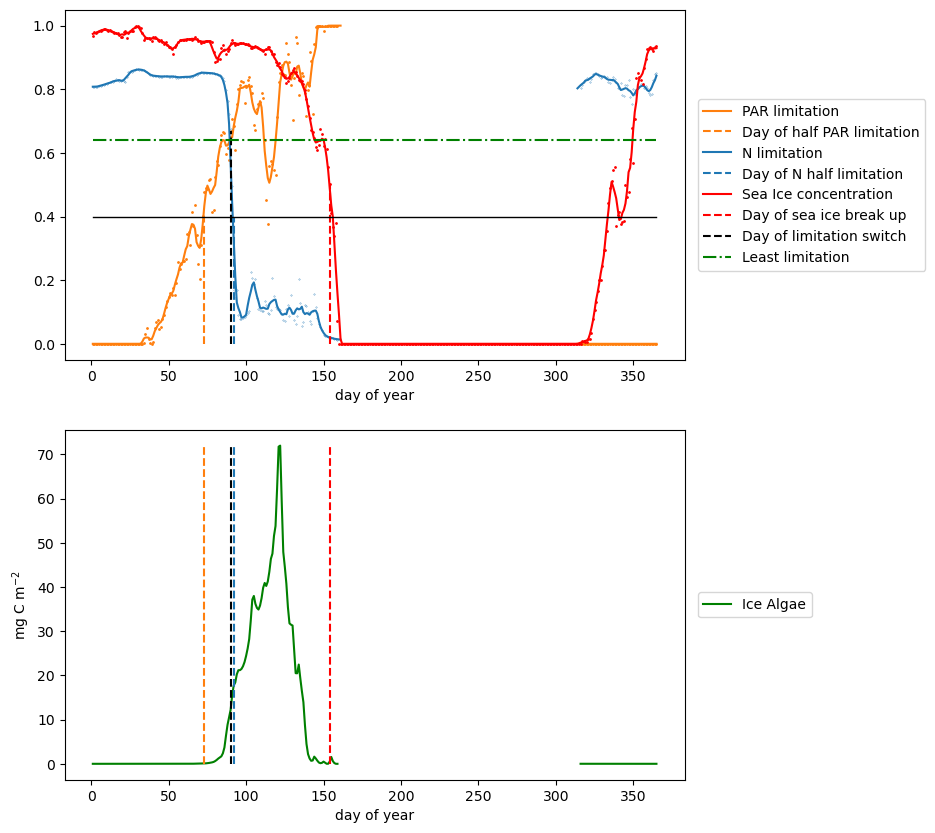

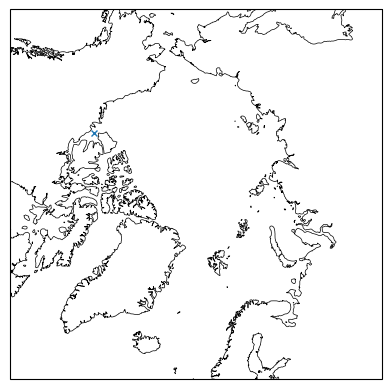

In [14]:
scn=scenarios[1]
year=2076

limpar=lim[scn+'limpar'].sel(time_counter=str(year)).limpar
limN=lim[scn+'limN'].sel(time_counter=str(year)).limN
doyPARlim = diagn[scn].doyPARlim4.sel(year=year)
doyNlim = diagn[scn].doyNlim4.sel(year=year)
sicy=dadic[scn+'biolog'].ileadfra2.sel(time_counter=str(year))
doySIbu=diagn[scn].doySIbreak.sel(year=year)
doySwitch=diagn[scn].doyPARlimGTnlim.sel(year=year)
leastlim=diagn[scn].least_lim.sel(year=year)
ia=dadic[scn+'biolog'].icediagca.sel(time_counter=str(year))


# xi,yi =[limpar.max(dim=['time_counter']).argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi =[doyNlim.argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi=259, 119 ##CAA nemesis
# xi,yi=379, 2 ## low lat N snd spike
# xi,yi= 150,150 # beafirt low
xi,yi=158, 92 ## amundsen gulf 2nd N max
# xi,yi=310, 100 ## baffin 2nd N

# xi,yi =[clim[scn+'icedia'].sel(dayofyear=slice(250,365)).max(dim=['dayofyear']).argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]

# xi,yi = [doySIbu.where(doySIbu>50).argmin(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi=412, 194 # greenland crazy ice
# xi,yi=128, 110 ## near amdmusen
# xi,yi=180,345 #siberia
# xi,yi=85,288 #siberia

# xi,yi= 235, 46  #CAA
# xi,yi= 180, 52  #CAA

print(xi,yi)


pc,nc,ic='tab:orange','tab:blue','r'
fig,ax=plt.subplots(2,1,figsize=(8,10))
days=range(1,366)
    
ax[0].plot(days,limpar.isel(x=xi,y=yi),'.',c=pc,ms=2)
smLpar = limpar.isel(x=xi,y=yi).rolling(time_counter=5,min_periods=1,center=True).mean()
ax[0].plot(days,smLpar,c=pc,label='PAR limitation')
dlimP = doyPARlim.isel(x=xi,y=yi)
ax[0].plot([dlimP,dlimP],[0,0.4],'--',c=pc, label='Day of half PAR limitation')
# dlimP = dgnst.doyPARlim(clim[scn+'limpar'].isel(x=xi,y=yi),0.5)
# ax[0].plot([dlimP,dlimP],[0,0.5],'--',c=pc)

ax[0].plot(days,limN.isel(x=xi,y=yi),'.',c=nc,ms=0.5)
smLn = limN.isel(x=xi,y=yi).rolling(time_counter=5,min_periods=1,center=True).mean()
ax[0].plot(days,smLn,c=nc,label='N limitation')
dlimN = doyNlim.isel(x=xi,y=yi)
ax[0].plot([dlimN,dlimN],[0,0.4],'--',c=nc, label='Day of N half limitation')
# dlimN2= dgnst.doyNlim(clim[scn+'limN'].isel(x=xi,y=yi),0.5)
# ax[0].plot([dlimN2,dlimN2],[0,0.5],'--',c=nc)

ax[0].plot(days,sicy.isel(x=xi,y=yi),'.',c=ic,ms=2)
smSic = sicy.isel(x=xi,y=yi).rolling(time_counter=5,min_periods=1,center=True).mean()
ax[0].plot(days,smSic,c=ic,label='Sea Ice concentration')
dlimSIb = doySIbu.isel(x=xi,y=yi)
# dlimSIb = dgnst.doySIbreak(clim[scn+'ileadfra2'].isel(x=xi,y=yi),0.5)
ax[0].plot([dlimSIb,dlimSIb],[0,0.5],'--',c=ic, label='Day of sea ice break up')

ax[0].legend(loc='center right')
ax[0].plot([1,365],[0.4,0.4],'k',lw=1)

dlim = doySwitch.isel(x=xi,y=yi)
ax[0].plot([dlim,dlim],[0,limpar.isel(x=xi,y=yi).sel(time_counter=limpar.time_counter.dt.dayofyear.isin([dlim]))[0]],'k--', label='Day of limitation switch')
# ax[0].plot([dlim,dlim],[0,limswitch.isel(x=xi,y=yi)],'k--')

least_lim = leastlim.isel(x=xi,y=yi)
ax[0].plot([1,365],[least_lim]*2,'g-.', label='Least limitation')


# dSIfu = dgnst.doySIfreezeUp(clim[scn+'ileadfra2'].isel(x=xi,y=yi),0.5)
# print(dSIfu)
# ax[0].plot([dSIfu,dSIfu],[0,0.5],'-.',c=ic)


ax[0].legend(loc='center left', bbox_to_anchor=(1.01, 0.5), ncol=1)   
ax[0].set_xlabel('day of year')





IA=ia.isel(x=xi,y=yi)/sicy.isel(x=xi,y=yi).where(sicy.isel(x=xi,y=yi)) *12
ax[1].plot(days,IA,'g',label='Ice Algae')
ax[1].legend()
    
iamax=IA.max()
ax[1].plot([dlimP,dlimP],[0,iamax],'--',c=pc)
ax[1].plot([dlimN,dlimN],[0,iamax],'--',c=nc)
ax[1].plot([dlim,dlim],[0,iamax],'k--')
ax[1].plot([dlimSIb,dlimSIb],[0,iamax],'--',c=ic)
# ax[1].plot([dSIfu,dSIfu],[0,iamax],'-.',c=ic)

ax[1].legend(loc='center left', bbox_to_anchor=(1.01, 0.5))   
ax[1].set_xlabel('day of year')
ax[1].set_ylabel('mg C m$^{-2}$')


fig,ax = mplt.initmaps()
ax.plot(dadic['mesh'].nav_lon.isel(x=xi,y=yi), dadic['mesh'].nav_lat.isel(x=xi,y=yi), 'x', ms=5,
        transform=ccrs.PlateCarree())


### Climatological averages of diagnostics

- \+ numbers of years a diagnostic is defined

In [14]:
for scn in scenarios:
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    print(scn)
    # averags of diagnostics
    lim[scn+'limpar'].limpar.groupby('time_counter.dayofyear').mean().to_netcdf(f'{savedir}limpar_20yclim{titleClim[scn][:9]}_1d.nc')
    lim[scn+'limN'].limN.groupby('time_counter.dayofyear').mean().to_netcdf(f'{savedir}limN_20yclim{titleClim[scn][:9]}_1d.nc')

historical-DFS-G510.00
RCP85-G510.14-G515.00-01


In [17]:
climdiag={}
for scn in scenarios:
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    print(scn)
    # averags of diagnostics
    climdiag[scn]=diagn[scn].mean('year')
    # number of years a diagnostic is defined
    for varn in diagn[scn].data_vars:
        climdiag[scn][varn+'_nyears'] = xr.where(diagn[scn][varn].isnull(),0,1).sum('year')
    # number of years sea ice concentration >= 50%
    sigt50=(dadic[scn+'biolog']['ileadfra2'].sel(time_counter=timeperiod[scn]).groupby('time_counter.year').max(dim='time_counter') >= 0.5)
    climdiag[scn]['SIgt50_nyears'] = sigt50.sum('year')
    # save
    climdiag[scn].to_netcdf(f'{savedir}IAdiagnostics_lim4_20yclim{titleClim[scn][:9]}.nc')

historical-DFS-G510.00


2023-04-27 19:15:08,478 - distributed.utils_perf - WARNING - full garbage collections took 16% CPU time recently (threshold: 10%)


RCP85-G510.14-G515.00-01


2023-04-27 19:16:18,322 - distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)


## Load

In [18]:
varsave = ['ileadfra2','icedia','fstric','iceno3','icenh4','icedia','limN','limpar']#'iicethic','isnowthi',
clim={}
for scn in scenarios:
    # clim[scn+'SImsk']=xr.open_dataarray(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/SImsk50_20y{titleClim[scn][:9]}_1d.nc')
    for var in varsave:
        clim[scn+var] = xr.open_dataarray(f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/{var}_20yclim{titleClim[scn][:9]}_1d.nc')

In [19]:
for scn in scenarios:
    clim[scn+'meanIA'] = clim[scn+'icedia'].sel(dayofyear=slice(60,181)).mean(dim='dayofyear')
    clim[scn+'peakIAfall'] = clim[scn+'icedia'].sel(dayofyear=slice(250,365)).max(dim='dayofyear')
    clim[scn+'peakIA'] = clim[scn+'icedia'].max(dim='dayofyear')
diffIAmean=clim[scenarios[1]+'meanIA'] - clim[scenarios[0]+'meanIA']
diffIApeak=clim[scenarios[1]+'peakIA'] - clim[scenarios[0]+'peakIA']

In [20]:
climdiag={}
for scn in scenarios:
    savedir = f'/tsanta/ahaddon/NAA/processedData/{scn}/panArctic/'
    climdiag[scn] = xr.open_dataset(f'{savedir}IAdiagnostics_lim4_20yclim{titleClim[scn][:9]}.nc').compute()
climdiag[scenarios[0]]

<xarray.Dataset>
Dimensions:                 (y: 400, x: 568)
Coordinates:
    nav_lat                 (y, x) float32 53.41 53.48 53.56 ... 44.23 44.11
    nav_lon                 (y, x) float32 -132.6 -132.5 -132.4 ... 15.75 15.66
Dimensions without coordinates: y, x
Data variables: (12/13)
    doySIbreak              (y, x) float64 nan nan nan nan ... nan nan nan nan
    doyNlim4                (y, x) float64 nan nan nan nan ... nan nan nan nan
    doyPARlim4              (y, x) float64 nan nan nan nan ... nan nan nan nan
    doyPARlimGTnlim         (y, x) float64 nan nan nan nan ... nan nan nan nan
    least_lim               (y, x) float32 nan nan nan nan ... nan nan nan nan
    lengthBloom             (y, x) float64 nan nan nan nan ... nan nan nan nan
    ...                      ...
    doyNlim4_nyears         (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    doyPARlim4_nyears       (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    doyPARlimGTnlim_nyears  (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    least_lim_nyears        (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    lengthBloom_nyears      (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    SIgt50_nyears           (y, x) int64 20 20 20 20 20 20 ... 20 20 20 20 20 20

## Single cell plots

158 92


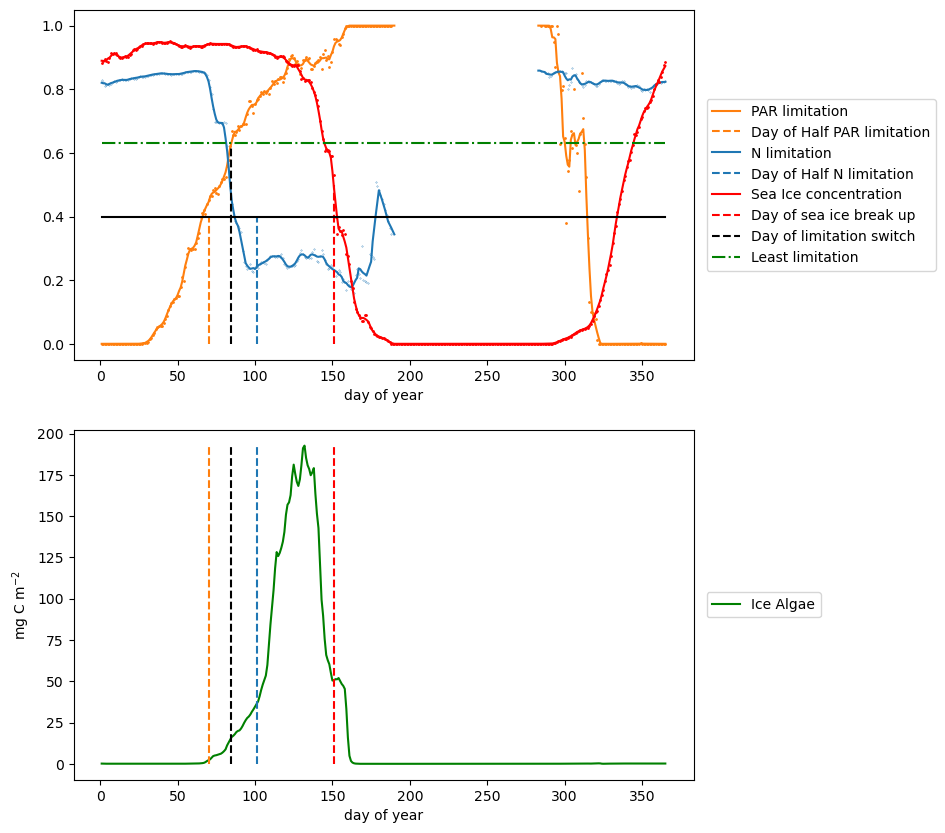

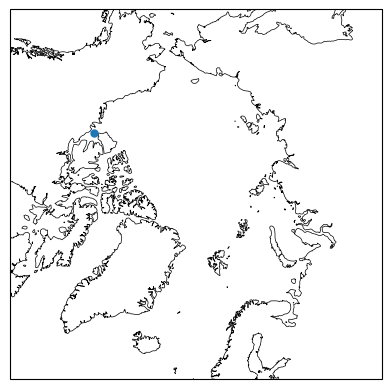

In [21]:
scn=scenarios[1]

limpar=clim[scn+'limpar']
limN=clim[scn+'limN']
doyPARlim = climdiag[scn].doyPARlim4
doyNlim = climdiag[scn].doyNlim4
doySIbu=climdiag[scn].doySIbreak
doySwitch=climdiag[scn].doyPARlimGTnlim
leastlim=climdiag[scn].least_lim
ia=clim[scn+'icedia']
sicy=clim[scn+'ileadfra2']


# xi,yi =[limpar.max(dim=['time_counter']).argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi =[doyNlim.argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi=259, 119 ##CAA nemesis
# xi,yi=379, 2 ## low lat N snd spike
# xi,yi= 150,150 # beafirt low
xi,yi=158, 92 ## amundsen gulf 2nd N max
# xi,yi=310, 100 ## baffin 2nd N

# xi,yi =[clim[scn+'icedia'].sel(dayofyear=slice(250,365)).max(dim=['dayofyear']).argmax(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]

# xi,yi = [doySIbu.where(doySIbu>50).argmin(dim=['x','y'],skipna=True)[k].values for k in ['x','y']]
# xi,yi=412, 194 # greenland crazy ice
# xi,yi=128, 110 ## near amdmusen
# xi,yi=180,345 #siberia
# xi,yi=85,288 #siberia
# xi,yi= 235, 46  #CAA

print(xi,yi)


pc,nc,ic='tab:orange','tab:blue','r'
days=range(1,366)

fig,ax=plt.subplots(2,1,figsize=(8,10))


ax[0].plot(days,limpar.isel(x=xi,y=yi),'.',c=pc,ms=2)
smLpar = limpar.isel(x=xi,y=yi).rolling(dayofyear=5,min_periods=1,center=True).mean()
ax[0].plot(days,smLpar,c=pc,label='PAR limitation')
# lparSTD = climdiagstd[scn+'limpar'].isel(x=xi,y=yi)
# ax[0].fill_between(days,smLpar-lparSTD, smLpar+lparSTD, color=pc, alpha=0.2)

dlimP = doyPARlim.isel(x=xi,y=yi)
ax[0].plot([dlimP,dlimP],[0,0.4],'--', c=pc, label='Day of Half PAR limitation')
# dlimPSTD = climdiagstd[scn].doyPARlim5.isel(x=xi,y=yi)
# ax[0].fill_betweenx([0,0.5],[dlimP-dlimPSTD]*2, [dlimP+dlimPSTD]*2, color=pc, alpha=0.2,)

# dlimP = dgnst.doyPARlim(clim[scn+'limpar'].isel(x=xi,y=yi),0.5)
# ax[0].plot([dlimP,dlimP],[0,0.5],'--',c=pc)


ax[0].plot(days,limN.isel(x=xi,y=yi),'.',c=nc,ms=0.5)
smLn = limN.isel(x=xi,y=yi).rolling(dayofyear=5,min_periods=1,center=True).mean()
ax[0].plot(days,smLn,c=nc,label='N limitation')
# lnSTD = climdiagstd[scn+'limN'].isel(x=xi,y=yi)
# ax[0].fill_between(days,smLn-lnSTD, smLn+lnSTD, color=nc, alpha=0.2)

dlimN = doyNlim.isel(x=xi,y=yi)
ax[0].plot([dlimN,dlimN],[0,0.4],'--',c=nc,  label='Day of Half N limitation')
# dlimNSTD = climdiagstd[scn].doyNlim5.isel(x=xi,y=yi)
# ax[0].fill_betweenx([0,0.5],[dlimN-dlimNSTD]*2, [dlimN+dlimNSTD]*2, color=nc, alpha=0.2)

# dlimN2= dgnst.doyNlim(clim[scn+'limN'].isel(x=xi,y=yi),0.5)
# ax[0].plot([dlimN2,dlimN2],[0,0.5],'--',c=nc)


ax[0].plot(days,sicy.isel(x=xi,y=yi),'.',c=ic,ms=2)
smSic = sicy.isel(x=xi,y=yi).rolling(dayofyear=5,min_periods=1,center=True).mean()
ax[0].plot(days,smSic,c=ic,label='Sea Ice concentration')
dlimSIb = doySIbu.isel(x=xi,y=yi)
# dlimSIb = dgnst.doySIbreak(clim[scn+'ileadfra2'].isel(x=xi,y=yi),0.5)
ax[0].plot([dlimSIb,dlimSIb],[0,0.5],'--',c=ic, label = 'Day of sea ice break up')

ax[0].plot([1,365],[0.4,0.4],'k')

dlim = doySwitch.isel(x=xi,y=yi)
ax[0].plot([dlim,dlim],[0,limpar.isel(x=xi,y=yi).sel(dayofyear=int(dlim))],'k--', label='Day of limitation switch')
# ax[0].plot([dlim,dlim],[0,limswitch.isel(x=xi,y=yi)],'k--')

least_lim = leastlim.isel(x=xi,y=yi)
ax[0].plot([1,365],[least_lim]*2,'g-.', label='Least limitation')


# dSIfu = dgnst.doySIfreezeUp(clim[scn+'ileadfra2'].isel(x=xi,y=yi),0.5)
# print(dSIfu)
# ax[0].plot([dSIfu,dSIfu],[0,0.5],'-.',c=ic)




### first calulation of lim : from mean N and PAR

# limpar=clim[scn+'limpar'] 
# limN= clim[scn+'limN'] 

    
# # ax[0].plot(days,limpar.isel(x=xi,y=yi),'.',c=pc,ms=2)
# smLpar = limpar.isel(x=xi,y=yi).rolling(dayofyear=5,min_periods=1,center=True).mean()
# ax[0].plot(days,smLpar,c=pc,ls=':',label='PAR lim from averaged PAR')

# # ax[0].plot(days,limN.isel(x=xi,y=yi),'.',c=nc,ms=0.5)
# smLn = limN.isel(x=xi,y=yi).rolling(dayofyear=5,min_periods=1,center=True).mean()
# ax[0].plot(days,smLn,c=nc,ls=':',label='N lim from averaged N ')



# ax[0].legend(loc='center right')

# ax[0].legend(loc='upper center', bbox_to_anchor=(0.5, -.15), ncol=2)   
ax[0].legend(loc='center left', bbox_to_anchor=(1.01, 0.5), ncol=1)   

ax[0].set_xlabel('day of year')




IA=ia.isel(x=xi,y=yi)*12
ax[1].plot(days,IA,'g',label='Ice Algae')

iamax=IA.max()
ax[1].plot([dlimP,dlimP],[0,iamax],'--',c=pc)
# dlimPSTD = climdiagstd[scn].doyPARlim5.isel(x=xi,y=yi)
# ax[1].fill_betweenx([0,iamax],[dlimP-dlimPSTD]*2, [dlimP+dlimPSTD]*2, color=pc, alpha=0.2, label='mean $\pm$ 1 STD')

ax[1].plot([dlimN,dlimN],[0,iamax],'--',c=nc)
# dlimNSTD = climdiagstd[scn].doyNlim5.isel(x=xi,y=yi)
# ax[1].fill_betweenx([0,iamax],[dlimN-dlimNSTD]*2, [dlimN+dlimNSTD]*2, color=nc, alpha=0.2, label='mean $\pm$ 1 STD')

ax[1].plot([dlim,dlim],[0,iamax],'k--')
# dlimSTD = climdiagstd[scn].doyPARlimGTnlim.isel(x=xi,y=yi)
# ax[1].fill_betweenx([0,iamax],[dlim-dlimSTD]*2, [dlim+dlimSTD]*2, color='k', alpha=0.2, label='mean $\pm$ 1 STD')

ax[1].plot([dlimSIb,dlimSIb],[0,iamax],'--',c=ic)
# dlimSIbSTD = climdiagstd[scn].doySIbreak.isel(x=xi,y=yi)
# ax[1].fill_betweenx([0,iamax],[dlimSIb-dlimSIbSTD]*2, [dlimSIb+dlimSIbSTD]*2, color=ic, alpha=0.2)#, label='mean $\pm$ 1 STD')

# ax[1].plot([dSIfu,dSIfu],[0,iamax],'-.',c=ic)

# ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, -.15))   
ax[1].legend(loc='center left', bbox_to_anchor=(1.01, 0.5), ncol=1)   

ax[1].set_xlabel('day of year')
ax[1].set_ylabel('mg C m$^{-2}$')


fig,ax = mplt.initmaps()
ax.plot(dadic['mesh'].nav_lon.isel(x=xi,y=yi), dadic['mesh'].nav_lat.isel(x=xi,y=yi), 'o', ms=5,
        transform=ccrs.PlateCarree())


## Maps

### Sea Ice mask

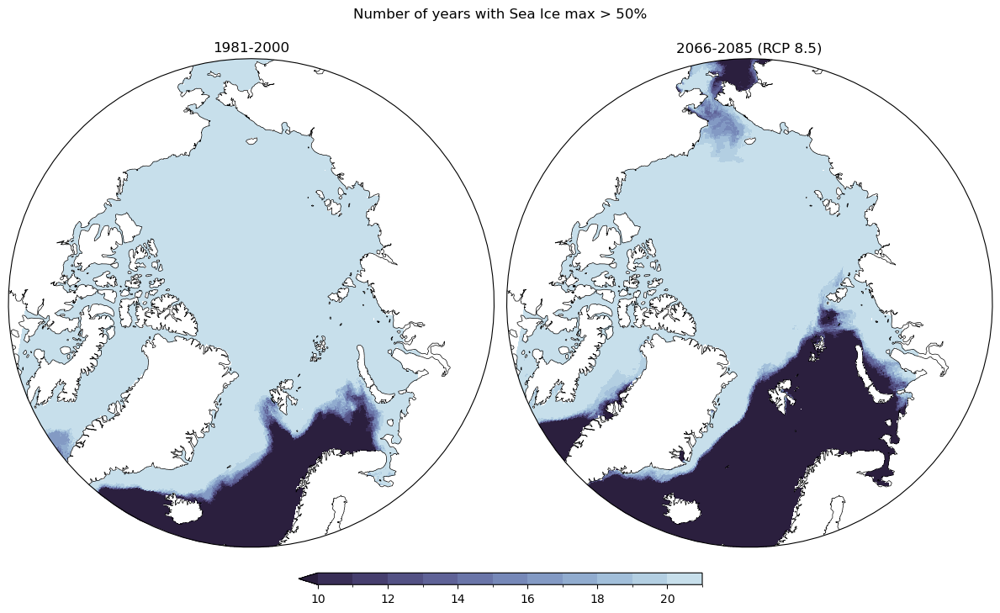

In [22]:
cmap, norm = colors.from_levels_and_colors(range(10,22), sns.color_palette("ch:s=.25,rot=-.25_r",n_colors=12),extend='min')

fig,ax = mplt.initmaps(1,2,figsize=(12,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Number of years with Sea Ice max > 50%')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['SIgt50_nyears'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], 
                          #vmin=20,vmax=30, colors.ListedColormap(sns.color_palette("ch:s=.25,rot=-.25_r",n_colors=11) ),
                          cmap=cmap,norm=norm )
cbar_ax = fig.add_axes([1/2-0.2, 0., 0.4, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='min', orientation='horizontal', shrink=0.4)
# cbar_ax.set_xticks(range(20,31));

### Ice Algae

#### IA spring mean

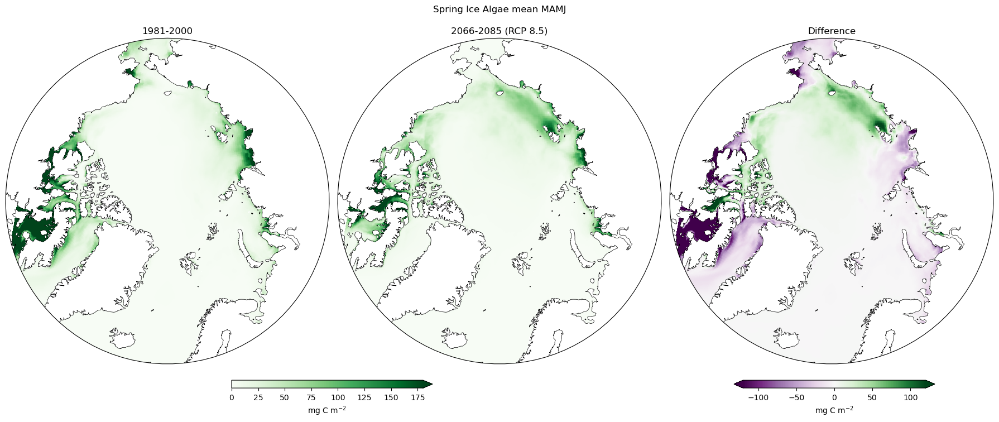

In [23]:
# plt.rcParams.update({'font.size': 16})
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Spring Ice Algae mean MAMJ')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(clim[scn+'meanIA']*12, dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], vmin=0,vmax=15*12, extend='max',
                          # cmap=cmOcSeq.Algae_5.mpl_colormap, 
                          cmap='Greens', #hatchMsk=climdiag[scn]['SIgt50_nyears']<20,
                        # norm=colors.LogNorm(vmin=0.1, vmax=10)
                           )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')

f,a,pl=mplt.singleMap(diffIAmean*12, dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, vmin=-10*12,vmax=10*12,
                          # cmap=cmOcDiv.Delta_5.mpl_colormap, 
                          cmap='PRGn', #hatchMsk=(climdiag[scenarios[0]]['SIgt50_nyears']<20)|(climdiag[scenarios[1]]['SIgt50_nyears']<20)
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')

#### IA maximum

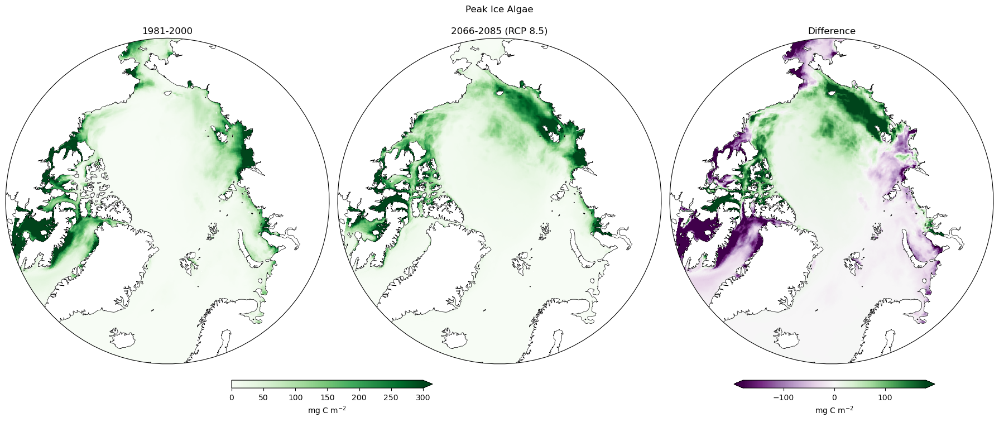

In [24]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Peak Ice Algae')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(clim[scn+'peakIA']*12, dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], 
                          cmap='Greens', #hatchMsk=climdiag[scn]['SIgt50_nyears']<20,
                          vmin=0,vmax=300, 
                          # norm=colors.LogNorm(vmin=1, vmax=1000)#50*12)
                           )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')
# cbar_ax.set_xticks([1,10,100,1000], [1,10,100,1000])

f,a,pl=mplt.singleMap(diffIApeak*12, dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, vmin=-15*12,vmax=15*12,
                          cmap='PRGn', #hatchMsk=(climdiag[scenarios[0]]['SIgt50_nyears']<20)|(climdiag[scenarios[1]]['SIgt50_nyears']<20)
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')

#### Fall IA maximum

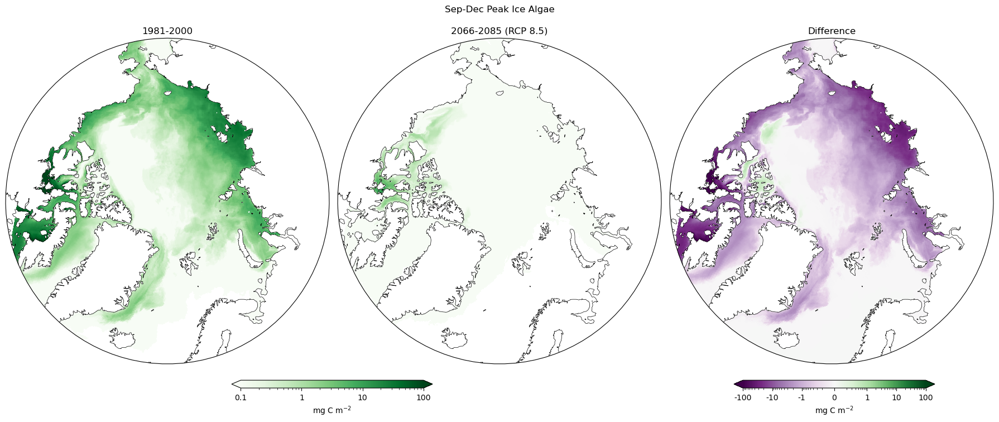

In [26]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Sep-Dec Peak Ice Algae')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(clim[scn+'peakIAfall']*12, dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], 
                          cmap='Greens', 
                          # vmin=0,vmax=15, 
                          norm=colors.LogNorm(vmin=0.1, vmax=100)#50*12)
                           )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')
cbar_ax.set_xticks([0.1,1,10,100], [0.1,1,10,100])

f,a,pl=mplt.singleMap(clim[scenarios[1]+'peakIAfall']*12 - clim[scenarios[0]+'peakIAfall']*12, 
                      dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, 
                      #vmin=-1,vmax=1,
                      norm=colors.SymLogNorm(linthresh=.1, linscale=.1, vmin=-100, vmax=100),
                          cmap='PRGn',
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')
cbar_ax.set_xticks([-100,-10,-1,0,1,10,100], [-100,-10,-1,0,1,10,100])
mitic=LogLocator(subs=range(2,10)).tick_values(1,10)[:-8]
cbar_ax.xaxis.set_ticks(np.concatenate((-mitic,mitic)), minor=True);

# plt.savefig('figs/Fall peak IA change hist rcp85.png',bbox_inches='tight',dpi=150)

## Diagnostics from daily data averaged

### Keys dates

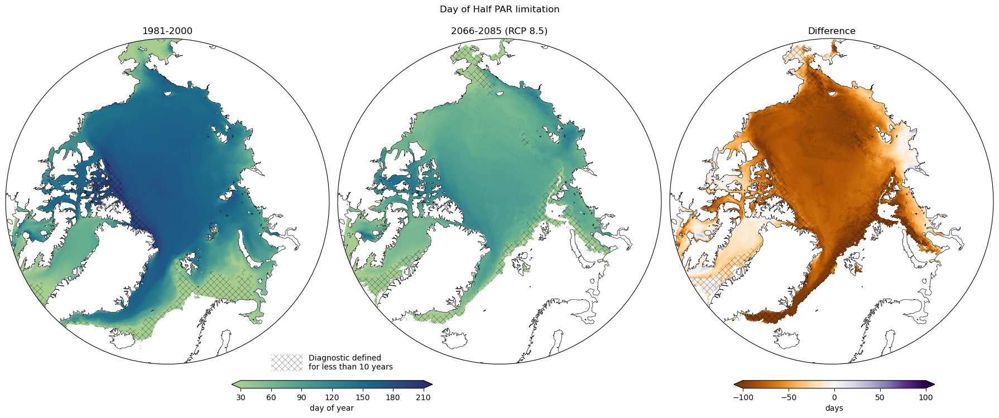

In [22]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Day of Half PAR limitation')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['doyPARlim4'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], vmin=30,vmax=210, cmap = sns.color_palette("crest", as_cmap=True),
                          hatchMsk=climdiag[scn].doyPARlim4_nyears<10, hatchlw=0.2, 
                         )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

f,a,pl=mplt.singleMap(climdiag[rcp85]['doyPARlim4'] - climdiag[hist]['doyPARlim4'], dadic, fig=fig,ax=ax[2],  
                      title='Difference', cbar=False, vmin=-100,vmax=100, #cmap='PuOr',
                      cmap='PuOr',
                      hatchMsk=(climdiag[hist].doyPARlim4_nyears<10)|(climdiag[rcp85].doyPARlim4_nyears<10), hatchlw=0.2,
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')


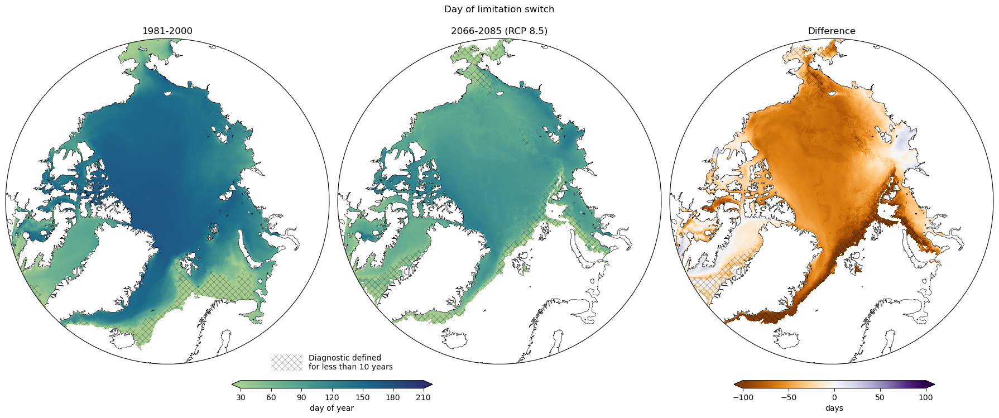

In [15]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Day of limitation switch')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['doyPARlimGTnlim'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], vmin=30,vmax=210, cmap=sns.color_palette("crest", as_cmap=True),
                          hatchMsk=climdiag[scn].doyPARlimGTnlim_nyears<10, hatchlw=0.2,
                         )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)


f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['doyPARlimGTnlim'] - climdiag[scenarios[0]]['doyPARlimGTnlim'], dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, vmin=-100,vmax=100,
                          cmap='PuOr',
                      hatchMsk=(climdiag[hist].doyPARlimGTnlim_nyears<10)|(climdiag[rcp85].doyPARlimGTnlim_nyears<10), hatchlw=0.2,
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')

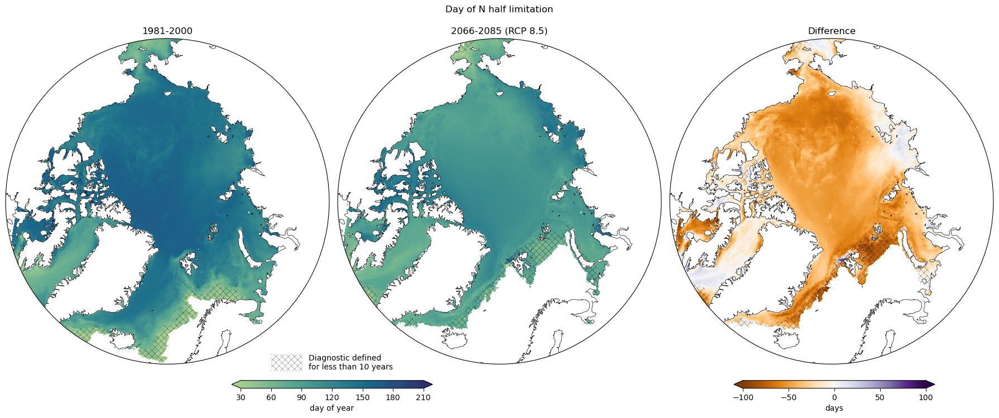

In [14]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Day of N half limitation')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['doyNlim4'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], vmin=30,vmax=210, cmap =sns.color_palette("crest", as_cmap=True),
                          hatchMsk=climdiag[scn].doyNlim4_nyears<10, hatchlw=0.2,
                         )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)


f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['doyNlim4'] - climdiag[scenarios[0]]['doyNlim4'], dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, vmin=-100,vmax=100,
                          cmap='PuOr',
                      hatchMsk=(climdiag[hist].doyNlim4_nyears<10)|(climdiag[rcp85].doyNlim4_nyears<10), hatchlw=0.2,
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')

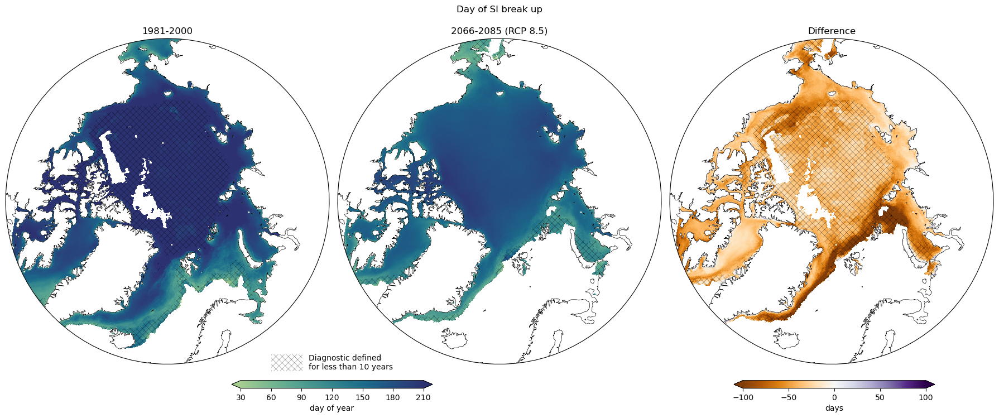

In [13]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Day of SI break up')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['doySIbreak'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], vmin=30,vmax=210,  cmap =sns.color_palette("crest", as_cmap=True),
                          hatchMsk=climdiag[scn].doySIbreak_nyears<10, hatchlw=0.2,
                         )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)


f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['doySIbreak'] - climdiag[scenarios[0]]['doySIbreak'], dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, vmin=-100,vmax=100,
                          cmap='PuOr',
                      hatchMsk=(climdiag[hist].doySIbreak_nyears<10)|(climdiag[rcp85].doySIbreak_nyears<10), hatchlw=0.2,                      
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')

#### Per time period

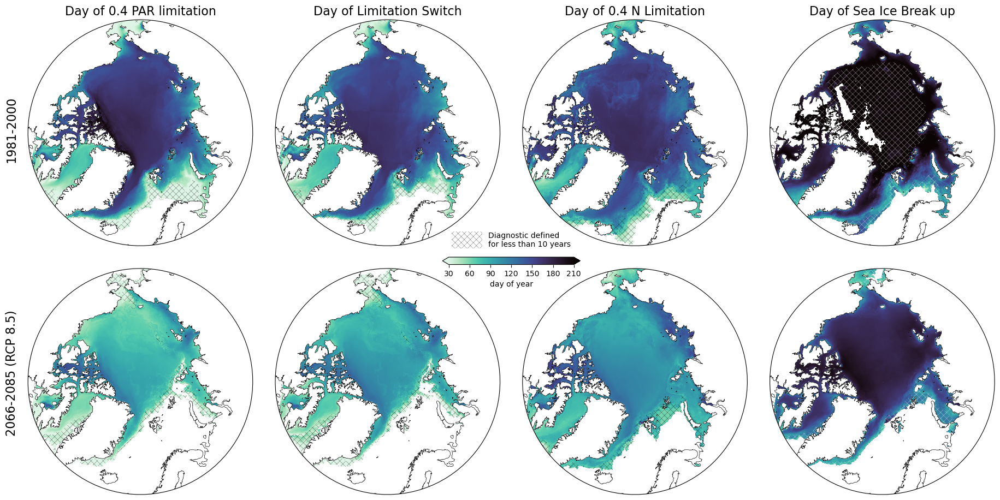

In [23]:
fig,ax = mplt.initmaps(2,4,figsize=(18,9),rnd=True,extent=[-180,180, 62,90])
fig.tight_layout()

ax[0,0].set_title('Day of 0.4 PAR limitation', fontsize=16)
ax[0,1].set_title('Day of Limitation Switch', fontsize=16)
ax[0,2].set_title('Day of 0.4 N Limitation', fontsize=16)
ax[0,3].set_title('Day of Sea Ice Break up', fontsize=16)

ax[0,0].text(-0.1,0.38, titleClim[hist], rotation='vertical', transform=ax[0,0].transAxes, fontsize=16)
ax[1,0].text(-0.1,0.27, titleClim[rcp85], rotation='vertical', transform=ax[1,0].transAxes, fontsize=16)

for i,scn in enumerate(scenarios):

    f,a,pl=mplt.singleMap(climdiag[scn]['doyPARlim4'], dadic, fig=fig,ax=ax[i,0], cbar=False, 
                          vmin=30,vmax=210, cmap = sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[scn].doyPARlim4_nyears<10, hatchlw=0.2, 
                         )
    
    f,a,pl=mplt.singleMap(climdiag[scn]['doyPARlimGTnlim'], dadic, fig=fig,ax=ax[i,1], cbar=False, 
                      vmin=30,vmax=210, cmap=sns.color_palette("mako_r", as_cmap=True),
                      hatchMsk=climdiag[scn].doyPARlimGTnlim_nyears<10, hatchlw=0.2,
                     )

    f,a,pl=mplt.singleMap(climdiag[scn]['doyNlim4'], dadic, fig=fig,ax=ax[i,2], cbar=False, 
                          vmin=30,vmax=210, cmap =sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[scn].doyNlim4_nyears<10, hatchlw=0.2,
                         )
    
    f,a,pl=mplt.singleMap(climdiag[scn]['doySIbreak'], dadic, fig=fig,ax=ax[i,3], cbar=False, 
                          vmin=30,vmax=210,  cmap =sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[scn].doySIbreak_nyears<10, hatchlw=0.2, hatchColor='w',
                         )

plt.subplots_adjust(wspace=0.1,hspace=0.1)
cbar_ax = fig.add_axes([1/2-0.07, 1/2-0.015, 0.14, 0.015])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center',bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

### Length of bloom

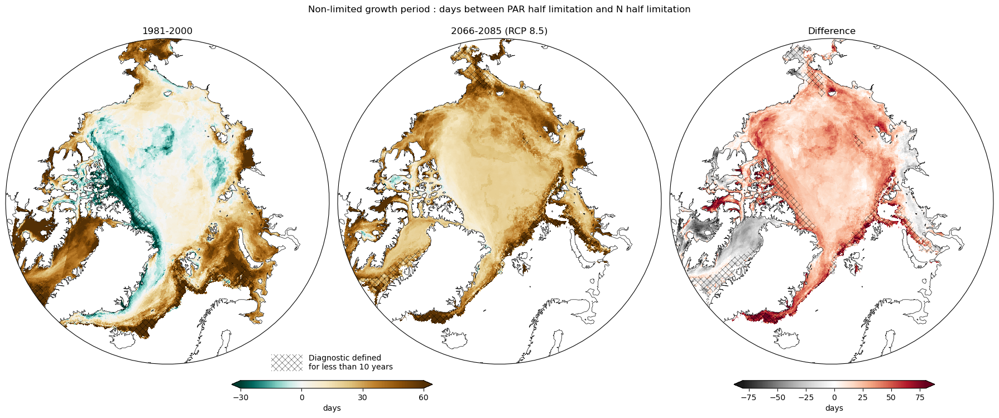

In [24]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Non-limited growth period : days between PAR half limitation and N half limitation')
fig.tight_layout()

BrBG_r_shifted, normBrBG_r_shifted, ticks = mplt.shiftCMAP(-30, 60, 0,'BrBG_r')

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['lengthBloom'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], #vmin=-60,vmax=60,
                          cmap=BrBG_r_shifted,norm=normBrBG_r_shifted,
                          hatchMsk=climdiag[scn].lengthBloom_nyears<10 , hatchlw=0.3,
                           )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4, ticks=ticks)
cl.set_label('days')
cbar_ax.tick_params(which='minor',length=0)

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['lengthBloom'] - climdiag[scenarios[0]]['lengthBloom'], 
                      dadic, fig=fig,ax=ax[2], title='Difference', cbar=False, 
                      cmap='RdGy_r', vmin=-80,vmax=80,
                      hatchMsk=(climdiag[hist].lengthBloom_nyears<10)|(climdiag[rcp85].lengthBloom_nyears<10),  hatchlw=0.3,
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')

#### Least Limitation

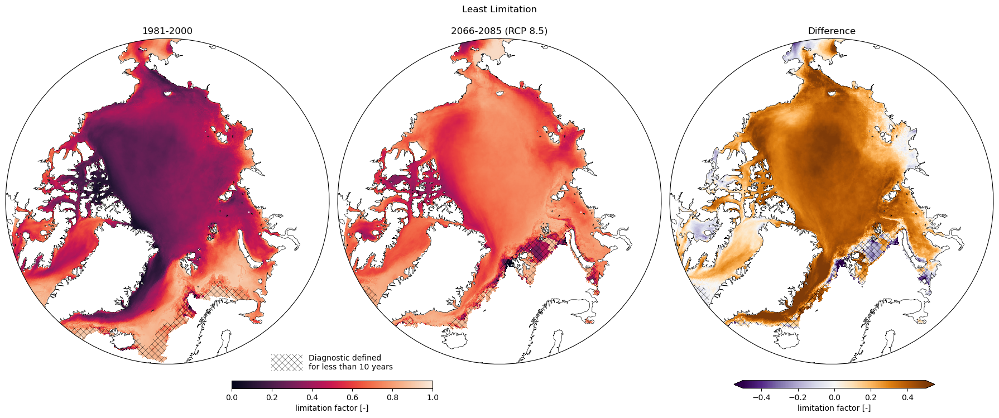

In [25]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Least Limitation')
fig.tight_layout()

for i,scn in enumerate(scenarios):
    f,a,pl=mplt.singleMap(climdiag[scn]['least_lim'], dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=titleClim[scn], vmin=0,vmax=1,
                          cmap=sns.color_palette("rocket", as_cmap=True),
                          hatchMsk=climdiag[scn].least_lim_nyears<10, hatchlw=0.3,
                           )
cbar_ax = fig.add_axes([1/3-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, orientation='horizontal', shrink=0.4)
cl.set_label('limitation factor [-]')

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['least_lim'] - climdiag[scenarios[0]]['least_lim'], 
                      dadic, fig=fig,ax=ax[2],  
                          title='Difference', cbar=False, vmin=-0.5,vmax=0.5,
                          cmap='PuOr_r',
                      hatchMsk=(climdiag[hist].least_lim_nyears<10)|(climdiag[rcp85].least_lim_nyears<10),  hatchlw=0.3,
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('limitation factor [-]')

### Explaining magnitude of IA blooms

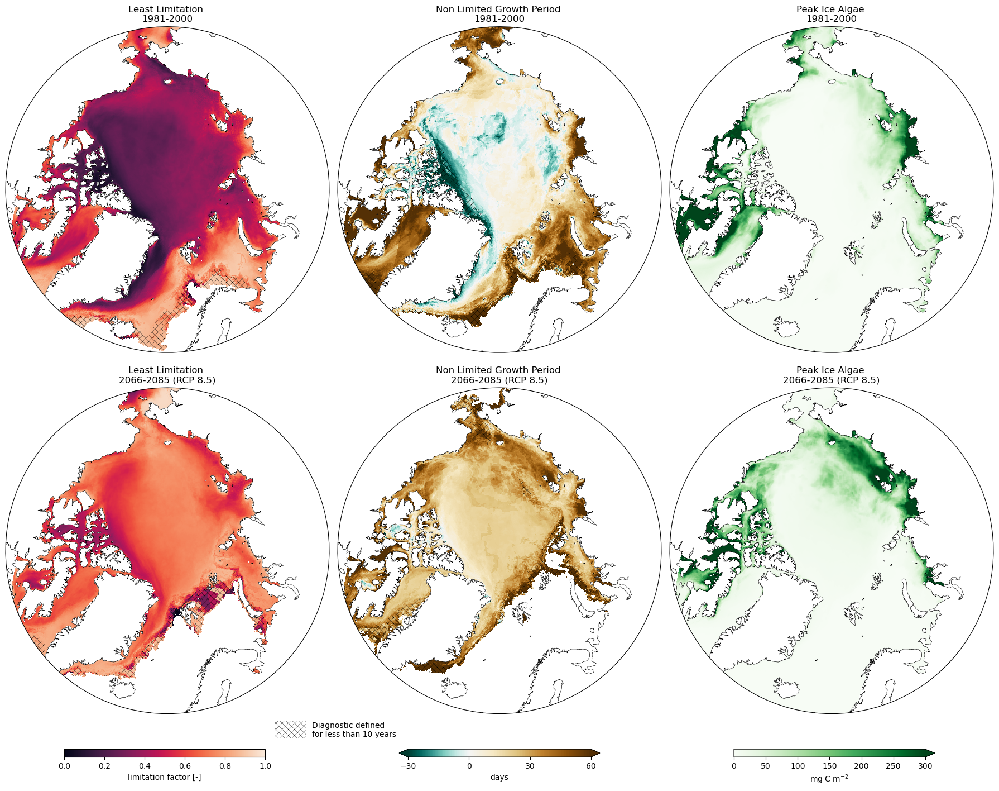

In [26]:
fig,ax = mplt.initmaps(2,3,figsize=(18,14),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('')
fig.tight_layout()

BrBG_r_shifted, normBrBG_r_shifted, ticks = mplt.shiftCMAP(-30, 60, 0,'BrBG_r')

for i,scn in enumerate(scenarios):
    
    f,a,pl0=mplt.singleMap(climdiag[scn]['least_lim'], dadic, fig=fig,ax=ax[i,0], cbar=False, 
                          title='Least Limitation \n'+titleClim[scn], vmin=0,vmax=1,
                          cmap=sns.color_palette("rocket", as_cmap=True),
                          hatchMsk=climdiag[scn].least_lim_nyears<10, hatchlw=0.3,
                           )
    
    
    f,a,pl1=mplt.singleMap(climdiag[scn]['lengthBloom'], dadic, fig=fig,ax=ax[i,1], cbar=False, 
                          title='Non Limited Growth Period \n'+titleClim[scn], #vmin=0,vmax=10, extend='max',
                          cmap=BrBG_r_shifted,norm=normBrBG_r_shifted,
                          hatchMsk=climdiag[scn].lengthBloom_nyears<10, hatchlw=0.3,                           
                           )
    
    f,a,pl2=mplt.singleMap(clim[scn+'peakIA']*12, dadic, fig=fig,ax=ax[i,2], cbar=False, 
                      title='Peak Ice Algae \n'+titleClim[scn], cmap='Greens', 
                      # norm=colors.LogNorm(vmin=1, vmax=1000)#50*12),
                      vmin=0,vmax=300,
                       )

cbar_ax = fig.add_axes([1/6-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pl0,cax=cbar_ax, orientation='horizontal', shrink=0.4)
cl.set_label('limitation factor [-]')

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.35, 1.5), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

cbar_ax = fig.add_axes([1/3+1/6-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pl1,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')
cl.set_ticks( ticks ) 
cbar_ax.tick_params(which='minor',length=0)

cbar_ax = fig.add_axes([2/3+1/6-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pl2,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')
# cbar_ax.set_xticks([1,10,100,1000], [1,10,100,1000]);


### Explaining changes in IA

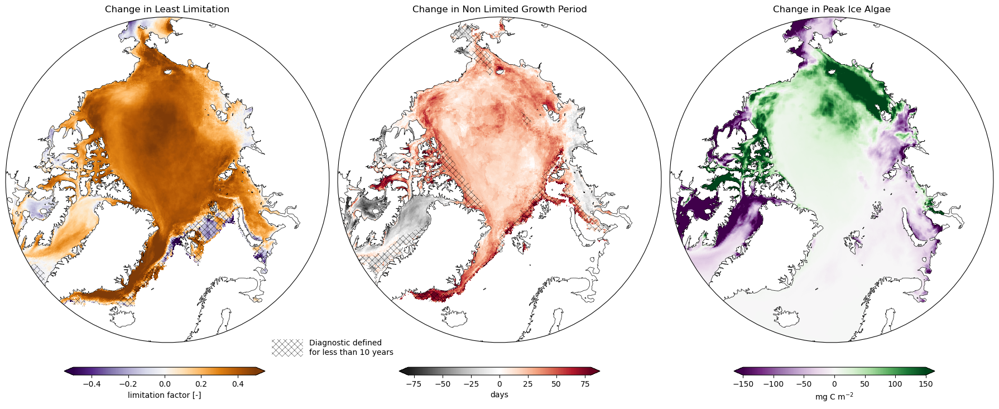

2023-04-27 19:51:27,888 - distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
2023-04-27 19:52:39,837 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
2023-04-27 19:56:03,293 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


In [27]:
fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.tight_layout()

#########################################
f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['least_lim'] - climdiag[scenarios[0]]['least_lim'], 
                      dadic, fig=fig,ax=ax[0],  
                          title='Change in Least Limitation', cbar=False, vmin=-0.5,vmax=0.5,
                          cmap='PuOr_r',
                      hatchMsk=(climdiag[hist].least_lim_nyears<10)|(climdiag[rcp85].least_lim_nyears<10),  hatchlw=0.3,
                           )
cbar_ax = fig.add_axes([1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('limitation factor [-]')

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.42, 1.5), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)


#########################################
f,a,pl=mplt.singleMap(climdiag[scenarios[1]]['lengthBloom'] - climdiag[scenarios[0]]['lengthBloom'], 
                      dadic, fig=fig,ax=ax[1],  
                          title='Change in Non Limited Growth Period', cbar=False, vmin=-80,vmax=80,
                          cmap='RdGy_r',
                      hatchMsk=(climdiag[hist].lengthBloom_nyears<10)|(climdiag[rcp85].lengthBloom_nyears<10),  hatchlw=0.3,
                           )
cbar_ax = fig.add_axes([1/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')
cbar_ax.tick_params(which='minor',length=0)


##########################################
f,a,pl=mplt.singleMap(diffIApeak*12, dadic, fig=fig,ax=ax[2],  
                          title='Change in Peak Ice Algae', cbar=False, vmin=-150,vmax=150,
                          cmap='PRGn',
                           )
cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')